In [1]:
# import libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
# read files
i = 2015

while i != 2024:

    globals()[f'df{i}'] = pd.read_csv(f'{i}_cleaned.csv')
    i += 1


In [4]:
def create_choropleth(dataset):
    fig = px.choropleth(dataset, 
                    locations="Country", 
                    locationmode='country names',
                    color="Happiness Score",  # Color represents Happiness Score
                    hover_name="Country", 
                    # animation_frame="Year",  # Year is the column representing the years in your dataset
                    color_continuous_scale=px.colors.sequential.Plasma,  # Choose the color scale
                    projection="natural earth"
                    )  # Choose the map projection style

    # Set the layout title and show the figure
    fig.update_layout(title_text='World Happiness Index (2015-2023)',
                    geo=dict(showcoastlines=True, coastlinecolor="Black", showland=True, landcolor="white",
                            showframe=False, projection_type="mercator"))

    # Show the animation
    fig.show()

In [5]:
create_choropleth(df2015)

In [7]:
import geopandas as gpd

# Replace 'ne_50m_admin_0_countries.shp' with the actual path to your shapefile
shapefile_path = '/Users/sean/Downloads/ne_50m_admin_0_countries/ne_50m_admin_0_countries.shp'

# Read the shapefile using geopandas
gdf = gpd.read_file(shapefile_path)

# Specify the path for the output GeoJSON file
output_geojson_path = 'output.geojson'

# Save the GeoDataFrame as GeoJSON
gdf.to_file(output_geojson_path, driver='GeoJSON')

In [8]:
import folium
map_happiness = folium.Map(location=[0, 0], zoom_start=2)

# Add the choropleth layer to the map
folium.Choropleth(
    geo_data='/Users/sean/SC4024/output.geojson',  # GeoJSON file with country boundaries
    data=df2015,
    columns=['Country', 'Happiness Score'],  # Columns from your dataset
    key_on='feature.properties.ADMIN',
    fill_color='YlGnBu',  # Choose a color scale
    legend_name='Happiness Score',  # Legend title
    highlight=True,
).add_to(map_happiness)

# Save the map as an HTML file or display it in Jupyter Notebook
map_happiness.save('happiness_map.html')


In [9]:
import folium
from IPython.display import display

map_happiness = folium.Map(location=[0, 0], zoom_start=2)

# Add the choropleth layer to the map
folium.Choropleth(
    geo_data='/Users/sean/SC4024/output.geojson',  # GeoJSON file with country boundaries
    data=df2015,
    columns=['Country', 'Happiness Score'],  # Columns from your dataset
    key_on='feature.properties.ADMIN',
    fill_color='YlGnBu',  # Choose a color scale
    legend_name='Happiness Score',  # Legend title
    highlight=True,
).add_to(map_happiness)

# Display the map in the notebook
display(map_happiness)


In [25]:
from geopy.geocoders import Nominatim
import json
map_happiness = folium.Map(location=[0, 0], zoom_start=2)
geolocator = Nominatim(user_agent="medal_map")

def create_medal_map(dataframe):
    geojson_path = '/Users/sean/SC4024/output.geojson'
    
    
    geojson_data = json.load(open(geojson_path, encoding='utf-8'))
    for feature in geojson_data['features']:
        country_name = feature['properties']['ADMIN']
        if country_name in dataframe:
            happiness_score = dataframe.loc[country_name, 'Happiness Score']
            feature['properties']['happiness_score'] = happiness_score
        
    map_happiness = folium.Map(location=[0, 0], zoom_start=2)
    
    title_html = f'<h3 align="center">2023</h3>'
    
    # Add the custom HTML element to the map as a popup
    title_popup = folium.Popup(folium.Html(title_html, script=True))
    title_popup.add_to(map_happiness)
    
    # Add Choropleth map
    cp = folium.Choropleth(
            geo_data=geojson_data,
            data=dataframe,
            columns=['Country', 'Happiness Score'],
            key_on='feature.properties.ADMIN',
            fill_color='RdYlGn',
            legend_name='Happiness Score',
            highlight=True,
        ).add_to(map_happiness)
    

    folium.GeoJsonTooltip(['NAME_EN']).add_to(cp.geojson)

    # Add LayerControl to the map
    folium.LayerControl().add_to(map_happiness)
    
    # Add custom medal markers
    top_countries = dataframe.head(3)
    for index, row in top_countries.iterrows():
        country_name = row['Country']
        
        try:
            location = geolocator.geocode(country_name)
            country_latitude = location.latitude
            country_longitude = location.longitude
        except:
            continue
        
        placing = row['Happiness Rank']
        if placing == 1:
            medal_image = '/Users/sean/SC4024/assets/gold.png'
        elif placing == 2:
            medal_image = '/Users/sean/SC4024/assets/silver.png'
        elif placing == 3:
            medal_image = '/Users/sean/SC4024/assets/bronze.png'
        else:
            medal_image = '/Users/sean/SC4024/assets/default_medal.png'
        
        custom_icon = folium.CustomIcon(icon_image=medal_image, icon_size=(50, 50))
        
        folium.Marker(
            location=[country_latitude, country_longitude],
            popup=folium.Popup(f'<img src="{medal_image}" width="50">', max_width=100),
            icon=custom_icon,
            tooltip=country_name,
        ).add_to(map_happiness)
    
    return map_happiness


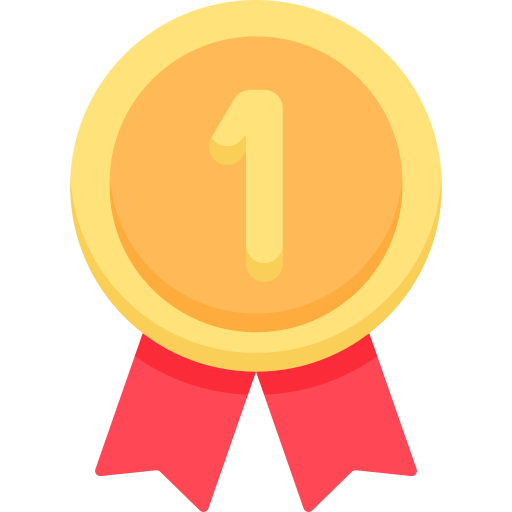
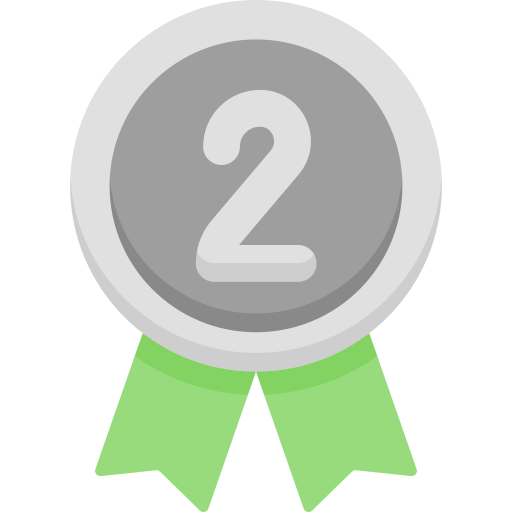
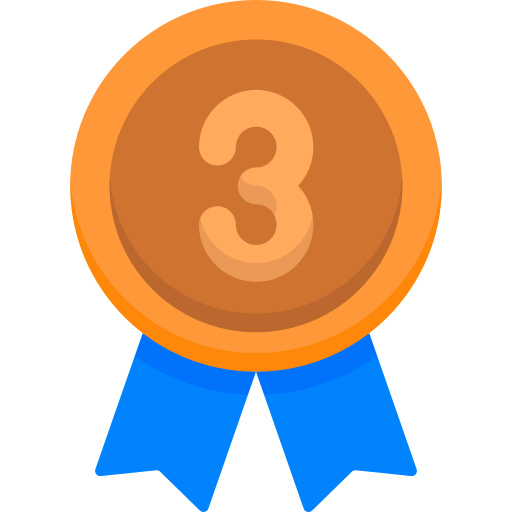

In [26]:
display(create_medal_map(df2023))

In [23]:
create_medal_map(df2023).save('2023_world.html')


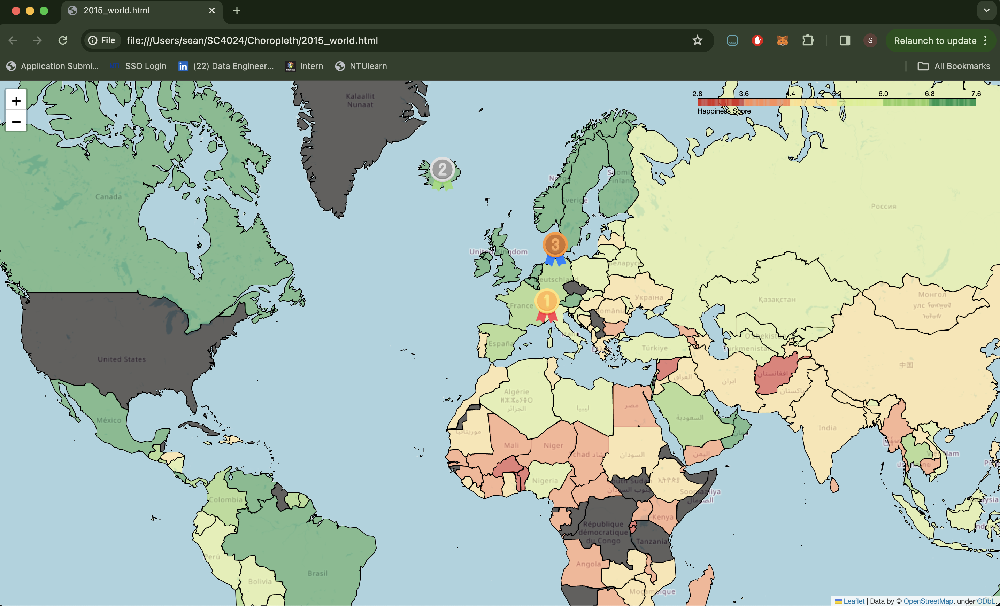

In [84]:
from IPython.display import Image

# Path to the PNG file
png_file_path = '//Users/sean/SC4024/assets/screenshot2015.png'

# Display PNG image
Image(png_file_path)


In [20]:
# do some regional eda

df2015['Region'].unique()

array(['Western Europe', 'North America', 'Australia and New Zealand',
       'Middle East and Northern Africa', 'Latin America and Caribbean',
       'Southeastern Asia', 'Central and Eastern Europe', 'Eastern Asia',
       'Sub-Saharan Africa', 'Southern Asia'], dtype=object)

In [27]:
import glob

def plot_region_average_happiness(data_directory, region_name):
    # List to store average happiness scores for each year
    average_scores = []
    global_average_scores = []  # List to store global average happiness scores for each year

    # Loop through each data file in the directory
    for file_path in glob.glob(f'{data_directory}/*.csv'):
        # Read data for the current year
        df = pd.read_csv(file_path)
        
        # Calculate the average happiness score for the specified region
        selected_region_data = df[df['Region'] == region_name]
        average_score = selected_region_data['Happiness Score'].mean()

        # Calculate the global average happiness score for the current year
        global_average_score = df['Happiness Score'].mean()
        
        # Extract year from the file name (assuming the file name contains the year)
        year = int(file_path.split('/')[-1].split('_')[0])  # Adjust the file name parsing logic
        
        # Append the average scores along with the year to the respective lists
        average_scores.append({'Year': year, 'Average Happiness Score': average_score})
        global_average_scores.append({'Year': year, 'Global Average Happiness Score': global_average_score})

    # Convert the lists of dictionaries to DataFrames
    average_scores_df = pd.DataFrame(average_scores).sort_values(by='Year')
    global_average_scores_df = pd.DataFrame(global_average_scores).sort_values(by='Year')

    # Create a time series plot
    plt.figure(figsize=(15, 8))
    
    # Plot average happiness score for the specified region
    sns.lineplot(x='Year', y='Average Happiness Score', data=average_scores_df, marker='o', label=f'{region_name} Average')
    
    # Plot global average happiness score
    sns.lineplot(x='Year', y='Global Average Happiness Score', data=global_average_scores_df, marker='o', label='Global Average', color='red')
    
    plt.title(f'Average Happiness Score over Time for {region_name} and Global Average')
    plt.xlabel('Year')
    plt.ylabel('Average Happiness Score')
    plt.grid(True)
    plt.legend()
    plt.show()


In [29]:
def plot_world_average_happiness(data_directory, region_name):
    # List to store average happiness scores across the world for each year
    average_scores_world = []

    # Loop through each data file in the directory
    for file_path in glob.glob(f'{data_directory}/*.csv'):
        # Read data for the current year
        df = pd.read_csv(file_path)
        
        # Calculate the average happiness score for the world
        average_score_world = df['Happiness Score'].mean()
        
        # Extract year from the file name (assuming the file name contains the year)
        year = int(file_path.split('/')[-1].split('_')[0])  # Adjust the file name parsing logic
        
        # Append the average score along with the year to the list
        average_scores_world.append({'Year': year, 'Average Happiness Score': average_score_world})

    # Convert the list of dictionaries to a NumPy array
    average_scores_world_array = np.array([(entry['Year'], entry['Average Happiness Score']) for entry in average_scores_world])
    
    # Convert the NumPy array to a pandas DataFrame
    average_scores_world_df = pd.DataFrame(average_scores_world_array, columns=['Year', 'Average Happiness Score'])
    
    # Sort the DataFrame based on year
    average_scores_world_df = average_scores_world_df.sort_values(by='Year')

    # Create a time series plot using seaborn
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='Year', y='Average Happiness Score', data=average_scores_world_df, marker='o')
    plt.title(f'Average Happiness Score across the World over Time')
    plt.xlabel('Year')
    plt.ylabel('Average Happiness Score')
    plt.grid(True)
    plt.show()

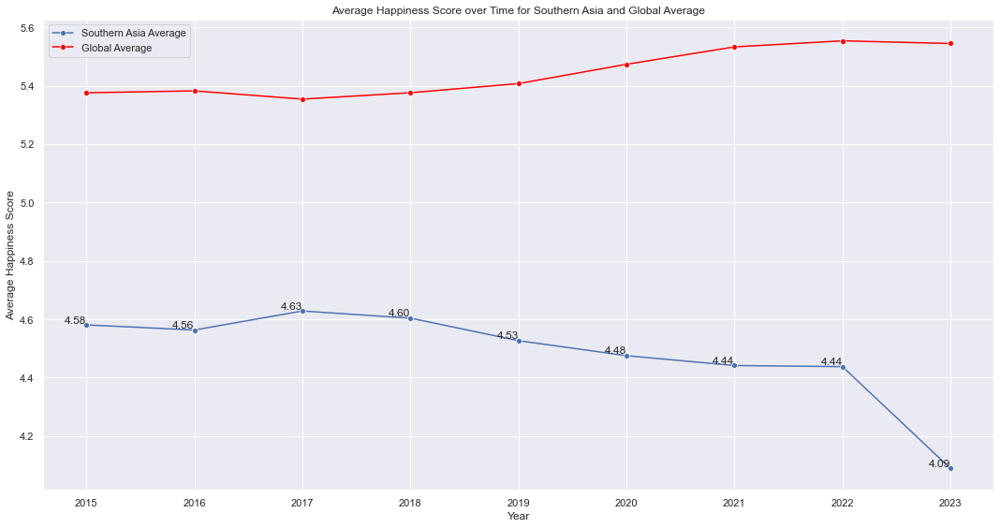

In [30]:
import pandas as pd
import glob
import seaborn as sns
import matplotlib.pyplot as plt

def plot_region_average_happiness(data_directory, region_name):
    # List to store average happiness scores for each year
    average_scores = []
    global_average_scores = []  # List to store global average happiness scores for each year

    # Loop through each data file in the directory
    for file_path in glob.glob(f'{data_directory}/*.csv'):
        # Read data for the current year
        df = pd.read_csv(file_path)
        
        # Calculate the average happiness score for the specified region
        selected_region_data = df[df['Region'] == region_name]
        average_score = selected_region_data['Happiness Score'].mean()

        # Calculate the global average happiness score for the current year
        global_average_score = df['Happiness Score'].mean()
        
        # Extract year from the file name (assuming the file name contains the year)
        year = int(file_path.split('/')[-1].split('_')[0])  # Adjust the file name parsing logic
        
        # Append the average scores along with the year to the respective lists
        average_scores.append({'Year': year, 'Average Happiness Score': average_score})
        global_average_scores.append({'Year': year, 'Global Average Happiness Score': global_average_score})

    # Convert the lists of dictionaries to DataFrames
    average_scores_df = pd.DataFrame(average_scores).sort_values(by='Year')
    global_average_scores_df = pd.DataFrame(global_average_scores).sort_values(by='Year')

    
    # Plot average happiness score for the specified region
    sns.set(style="darkgrid")
    plt.figure(figsize=(15, 8))
    
    # Plot average happiness score for the specified region
    sns.lineplot(x='Year', y='Average Happiness Score', data=average_scores_df, marker='o', label=f'{region_name} Average')
    
    # Plot global average happiness score
    sns.lineplot(x='Year', y='Global Average Happiness Score', data=global_average_scores_df, marker='o', label='Global Average', color='red')
    
    # Add annotations for specific data points (optional)
    for i, row in average_scores_df.iterrows():
        plt.text(row['Year'], row['Average Happiness Score'], f"{row['Average Happiness Score']:.2f}", ha='right', va='bottom')

    # Set plot labels and title
    plt.title(f'Average Happiness Score over Time for {region_name} and Global Average')
    plt.xlabel('Year')
    plt.ylabel('Average Happiness Score')
    plt.legend()
    plt.tight_layout()
    plt.show()

# Example usage
data_directory = '/Users/sean/SC4024'
region_name = 'Southern Asia'
plot_region_average_happiness(data_directory, region_name)


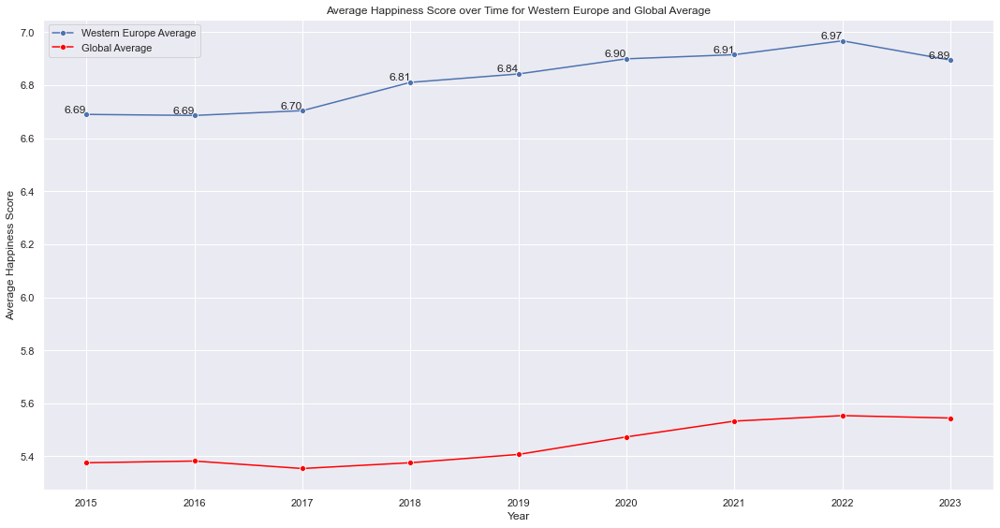

In [31]:
plot_region_average_happiness(data_directory, 'Western Europe')

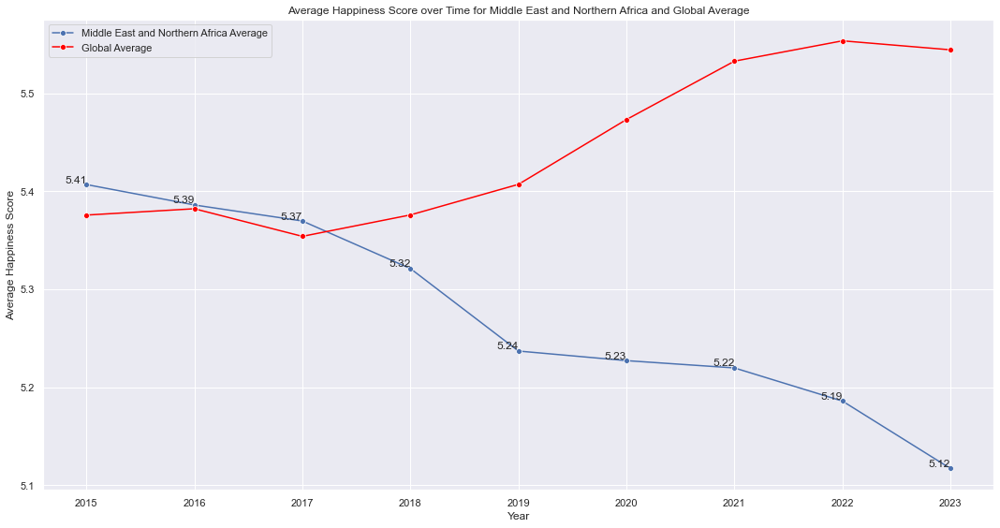

In [32]:
plot_region_average_happiness(data_directory, 'Middle East and Northern Africa')


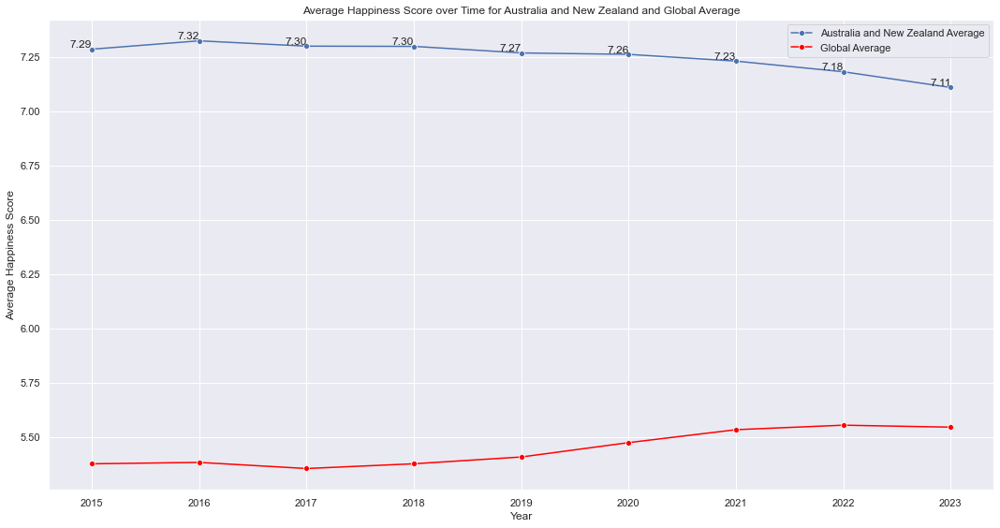

In [33]:
plot_region_average_happiness(data_directory, 'Australia and New Zealand')


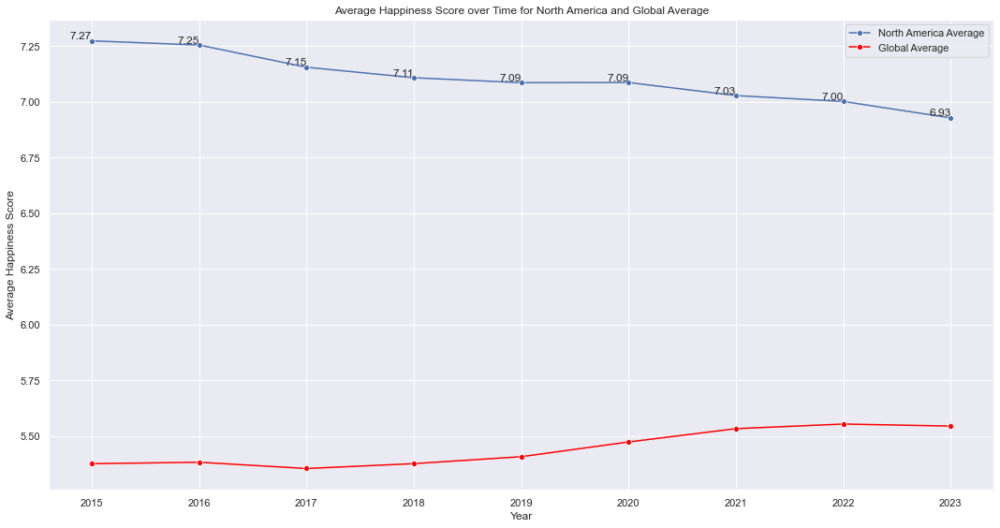

In [34]:
plot_region_average_happiness(data_directory, 'North America')


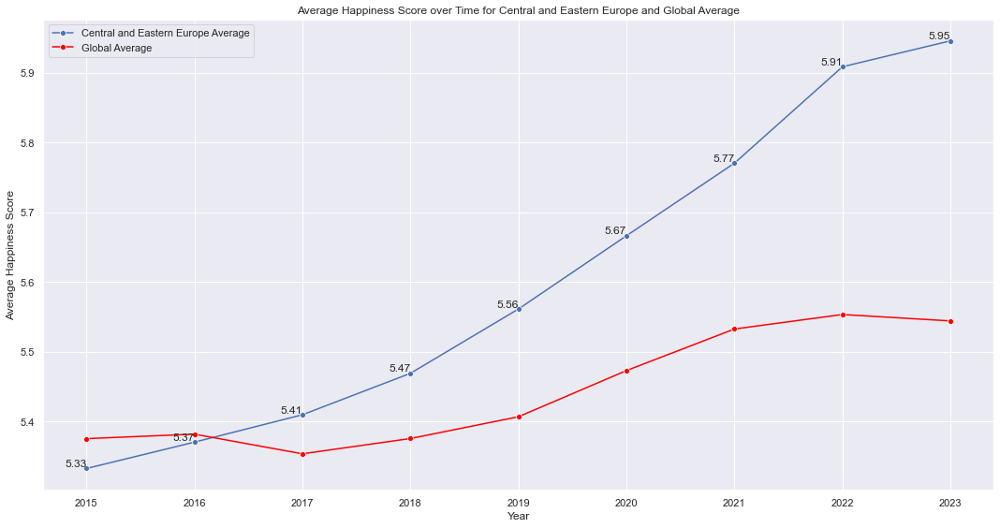

In [35]:
plot_region_average_happiness(data_directory, 'Central and Eastern Europe')


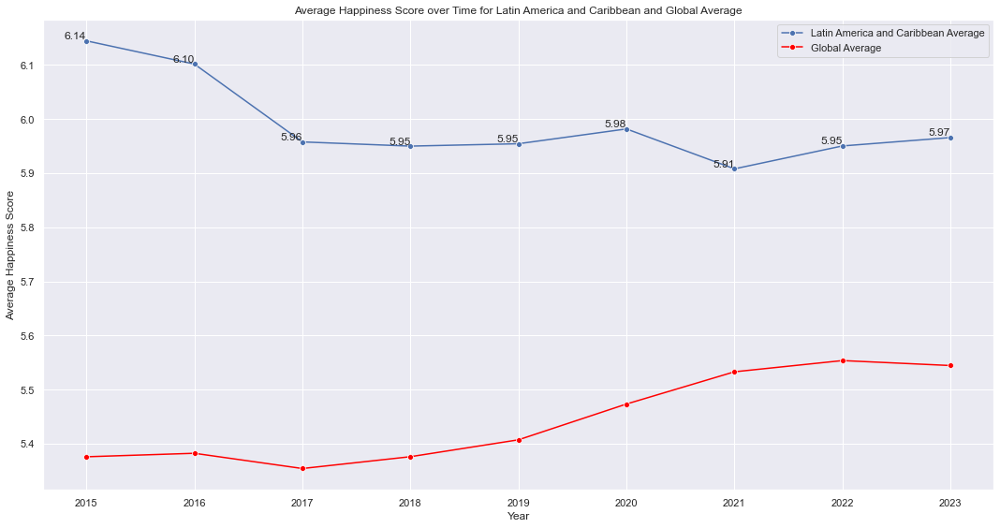

In [36]:
plot_region_average_happiness(data_directory, 'Latin America and Caribbean')


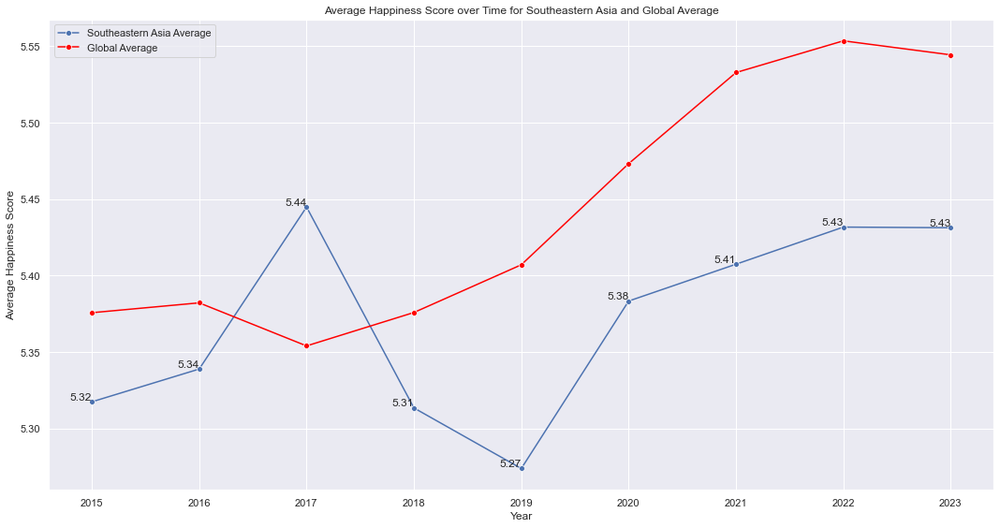

In [37]:
plot_region_average_happiness(data_directory, 'Southeastern Asia')


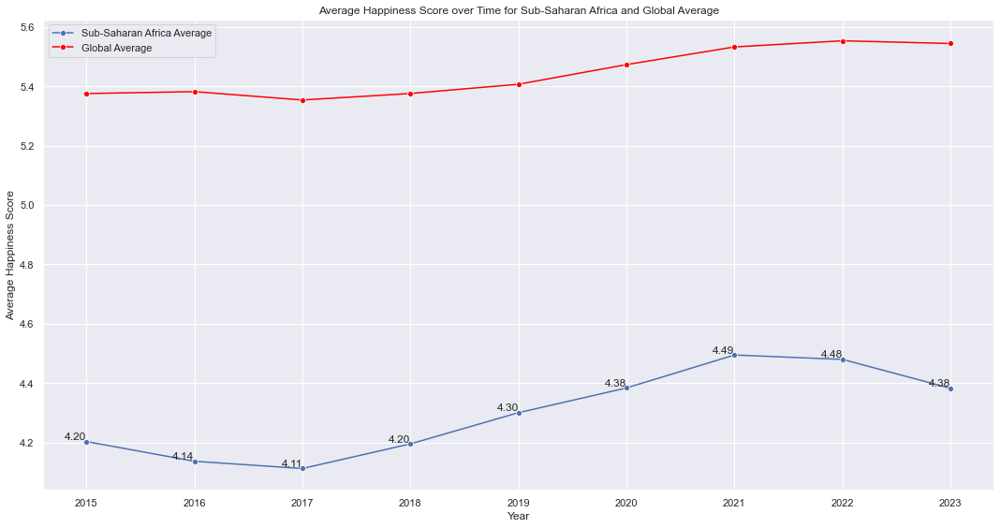

In [38]:
plot_region_average_happiness(data_directory, 'Sub-Saharan Africa')


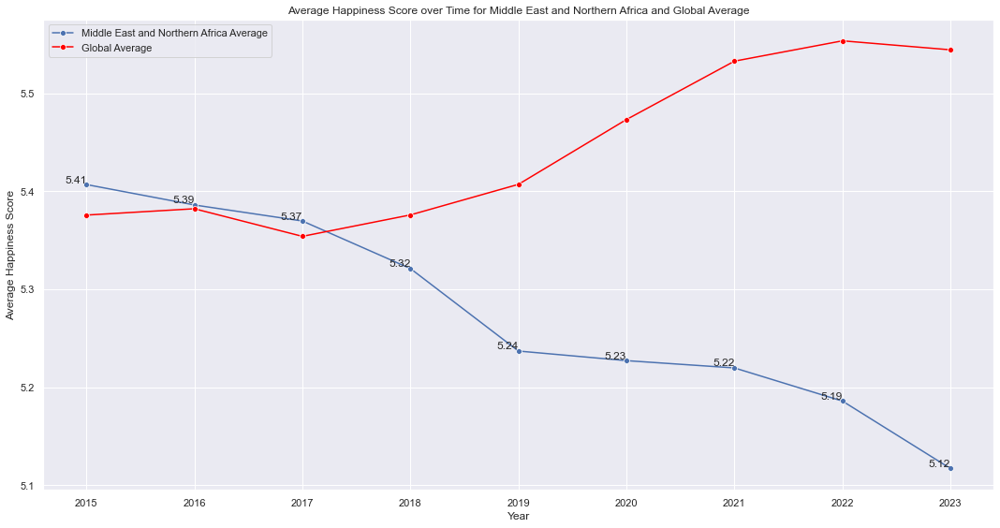

In [39]:
plot_region_average_happiness(data_directory, 'Middle East and Northern Africa')


In [40]:
df2023['Region'].unique()

array(['Western Europe', 'Middle East and Northern Africa',
       'Australia and New Zealand', 'North America',
       'Central and Eastern Europe', 'Latin America and Caribbean',
       'Southeastern Asia', 'Eastern Asia', 'Sub-Saharan Africa',
       'Southern Asia'], dtype=object)

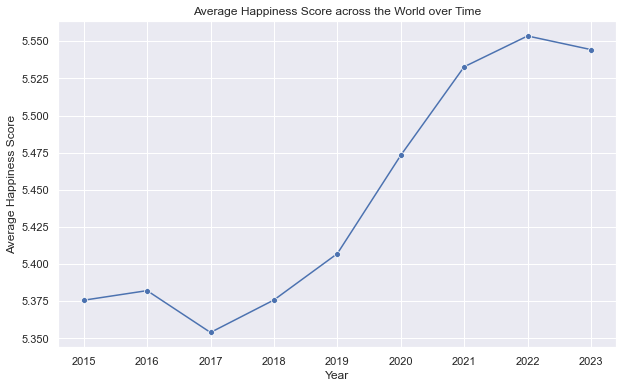

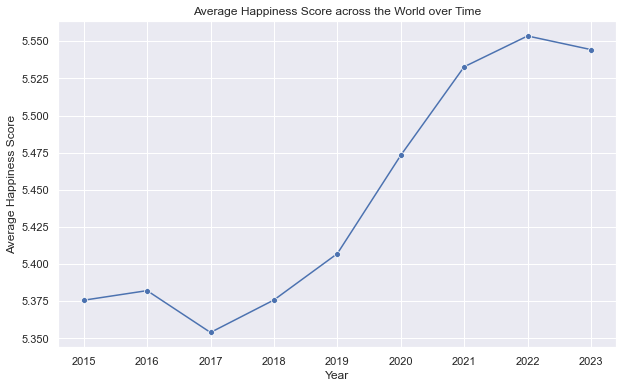

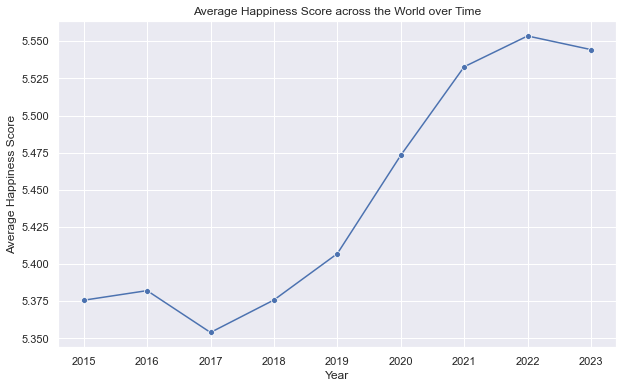

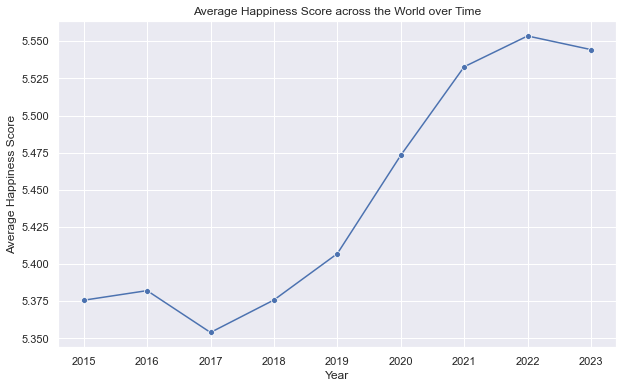

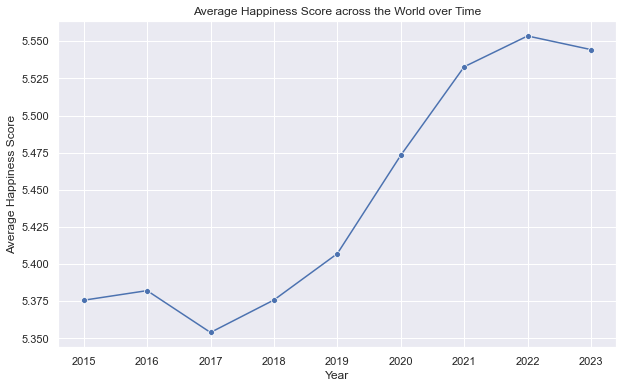

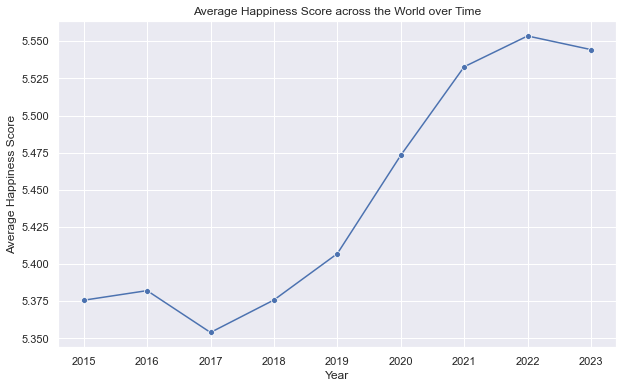

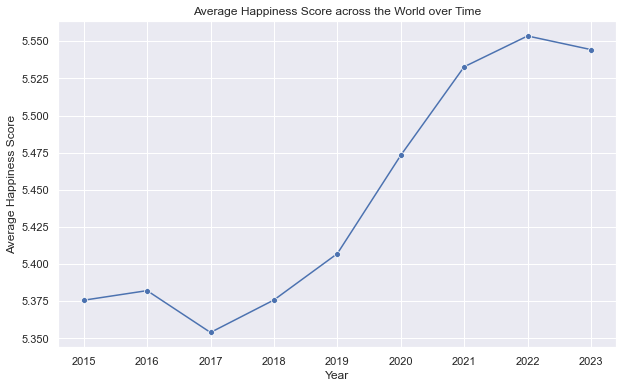

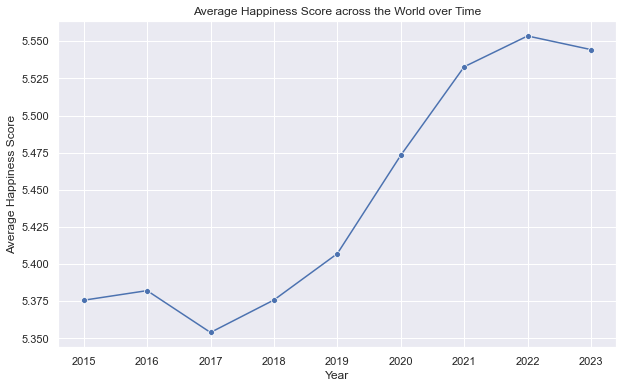

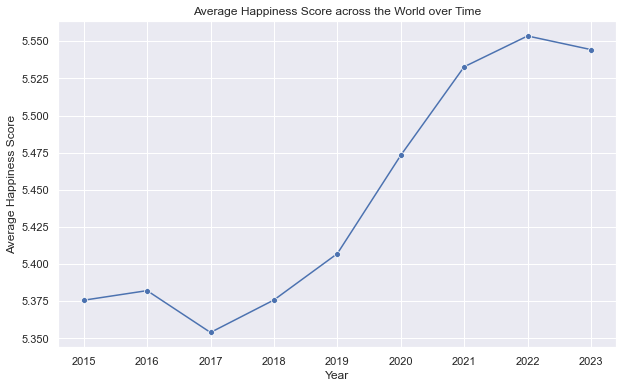

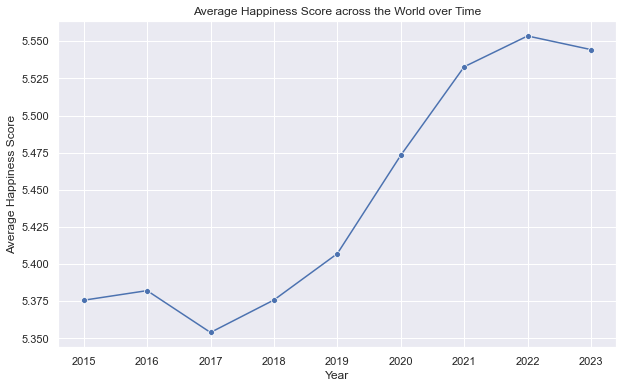

In [41]:
def plot_all_regions_average_happiness(data_directory):
    # Get a list of all available regions from the data files
    regions = set()

    for file_path in glob.glob(f'{data_directory}/*.csv'):
        df = pd.read_csv(file_path)
        regions.update(df['Region'].unique())

    # Loop through each region and plot average happiness scores
    for region_name in regions:
        plot_world_average_happiness(data_directory, region_name)

# Example usage
data_directory = '/Users/sean/SC4024'
plot_all_regions_average_happiness(data_directory)

In [42]:
def plot_all_regions_happiness(data_directory):
    # List to store average happiness scores for all regions
    all_regions_scores = []

    # Loop through each data file in the directory
    for file_path in glob.glob(f'{data_directory}/*.csv'):
        # Read data for the current year
        df = pd.read_csv(file_path)
        
        # Calculate the average happiness score for each region in the current year
        for region_name in df['Region'].unique():
            selected_region_data = df[df['Region'] == region_name]
            average_score = selected_region_data['Happiness Score'].mean()
            all_regions_scores.append({'Year': int(file_path.split('/')[-1].split('_')[0]), 'Region': region_name, 'Average Happiness Score': average_score})

    # Convert the list of dictionaries to a DataFrame
    all_regions_df = pd.DataFrame(all_regions_scores).sort_values(by=['Year', 'Region'])

    # Calculate world's average happiness score for each year
    world_avg_scores = all_regions_df.groupby('Year')['Average Happiness Score'].mean().reset_index()

    # Set a distinct color palette for the regions
    colors = sns.color_palette("husl", 10)

    # Create a single plot for all regions with distinctive colors
    plt.figure(figsize=(15, 10))
    sns.lineplot(x='Year', y='Average Happiness Score', hue='Region', data=all_regions_df, marker='o', palette=colors)
    sns.lineplot(x='Year', y='Average Happiness Score', data=world_avg_scores, color='black', linewidth=3, label='World Average')
    sns.set_style("darkgrid")
    plt.title('Average Happiness Score over Time for All Regions')
    plt.xlabel('Year')
    plt.ylabel('Average Happiness Score')
    plt.grid(True)
    plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.savefig('All Regions.png')
    plt.show()

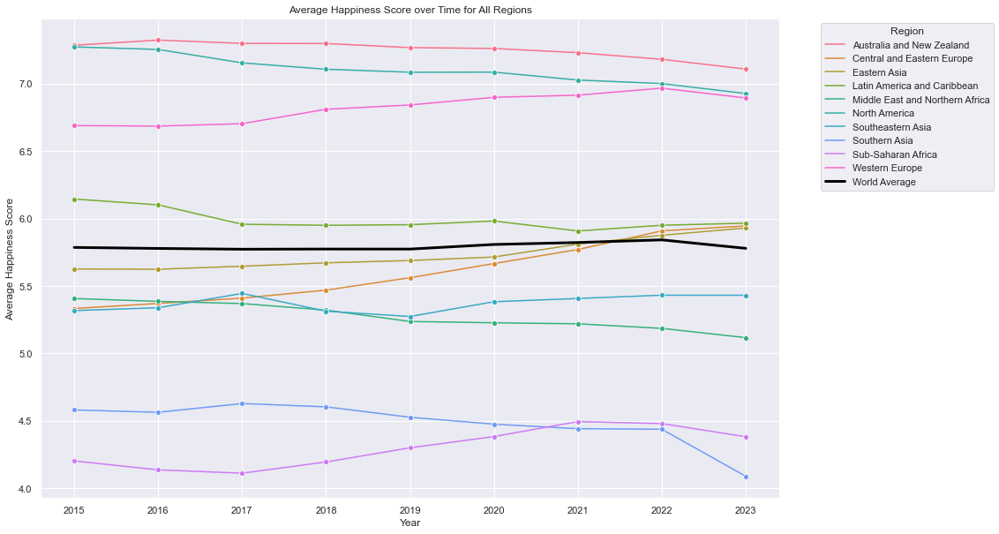

In [43]:
plot_all_regions_happiness('/Users/sean/SC4024')

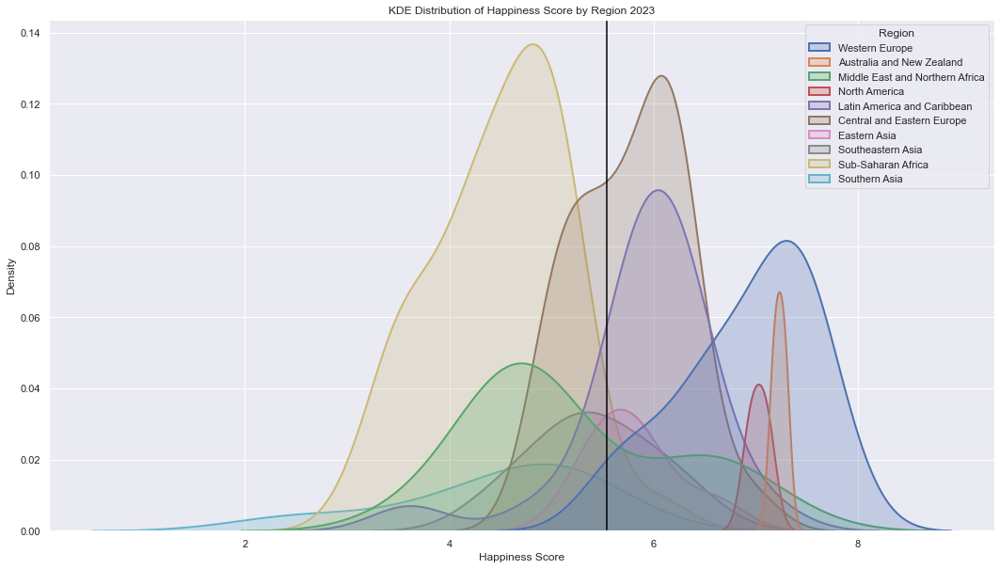

In [44]:

def plot_kde_with_mean(dataframe, numerical_column, categorical_column):

    plt.figure(figsize=(18, 10))
    
    sns.kdeplot(data=df2021, x="Happiness Score", hue="Region", fill=True, linewidth=2)
    sns.set_style(rc = {'axes.facecolor': 'white'})

    plt.axvline(df2023["Happiness Score"].mean(),c="black")
    plt.title("KDE Distribution of Happiness Score by Region 2023")
    

    plt.savefig('KDE.jpg')
# Example usage:
plot_kde_with_mean(df2015, "Happiness Score", "Region")




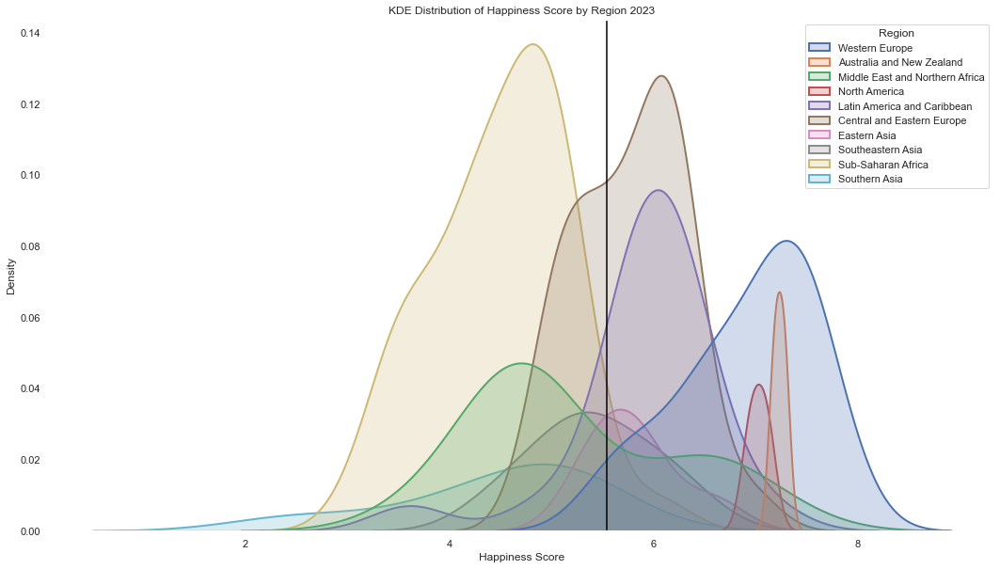

In [45]:
plot_kde_with_mean(df2017, "Happiness Score", "Region")


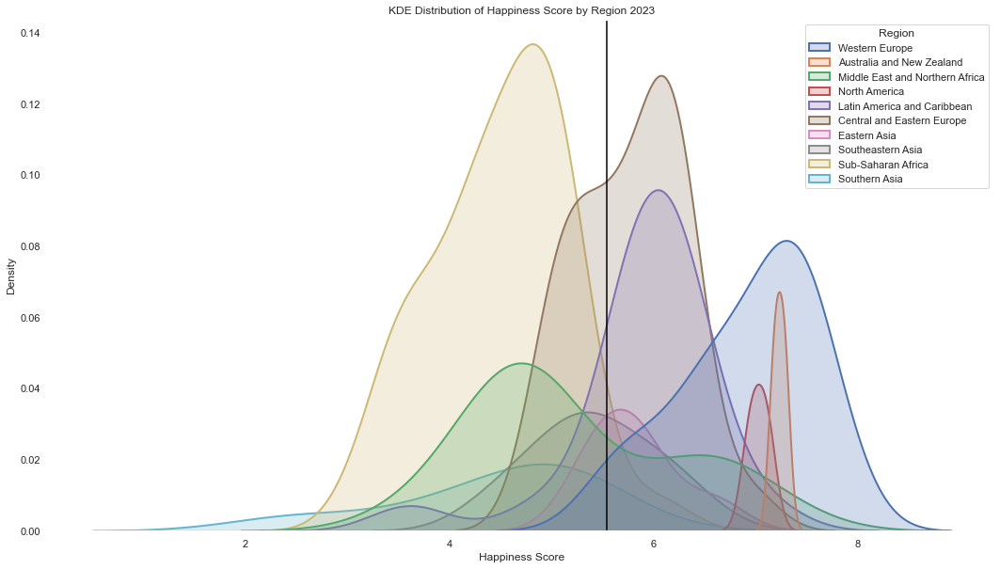

In [46]:
plot_kde_with_mean(df2018, "Happiness Score", "Region")


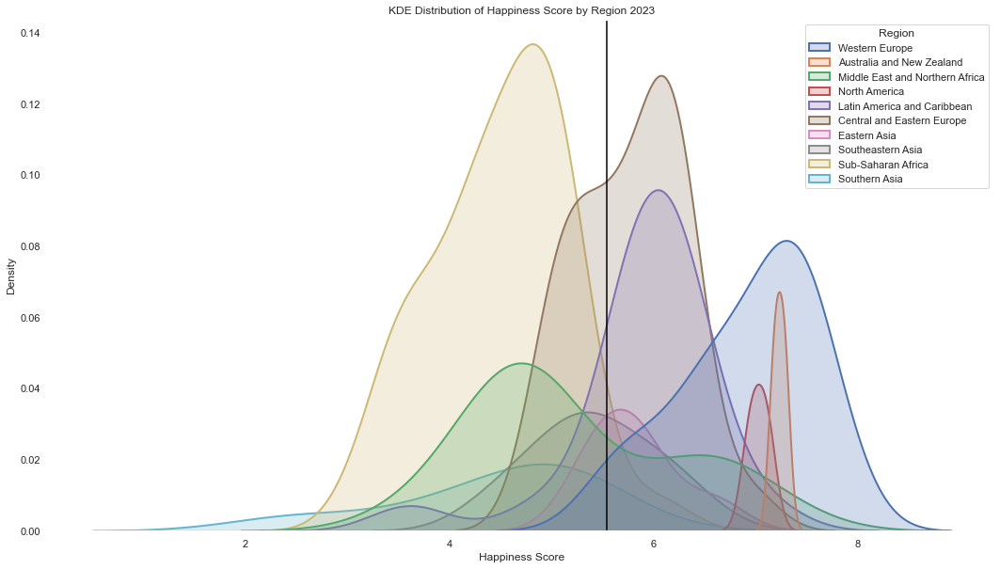

In [47]:
plot_kde_with_mean(df2019, "Happiness Score", "Region")


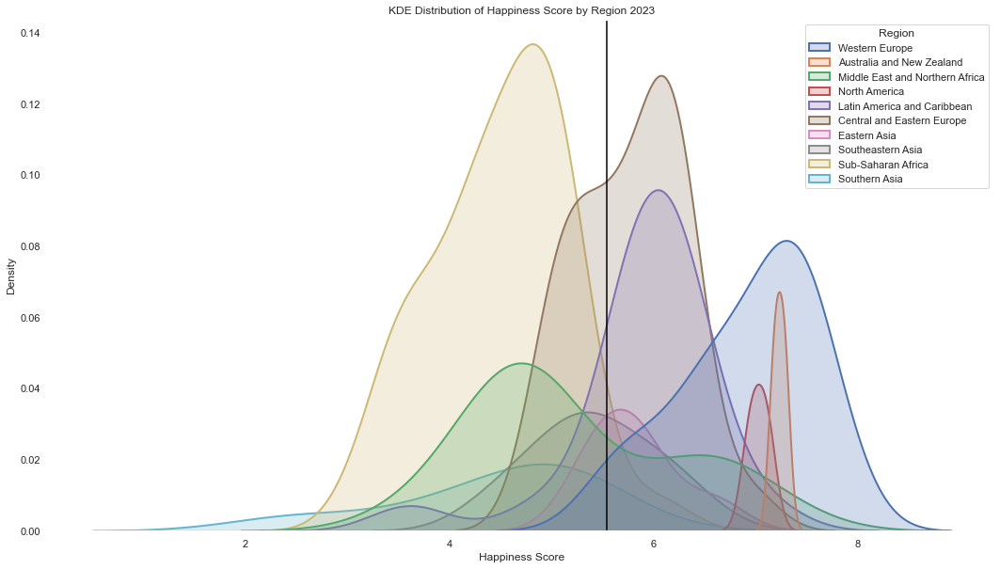

In [48]:
plot_kde_with_mean(df2020, "Happiness Score", "Region")


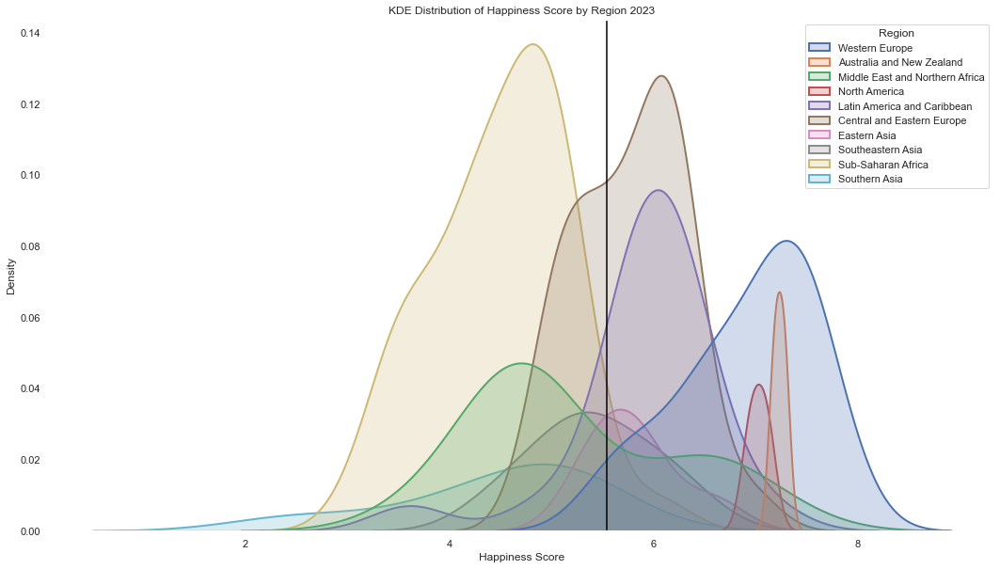

In [49]:
plot_kde_with_mean(df2021, "Happiness Score", "Region")


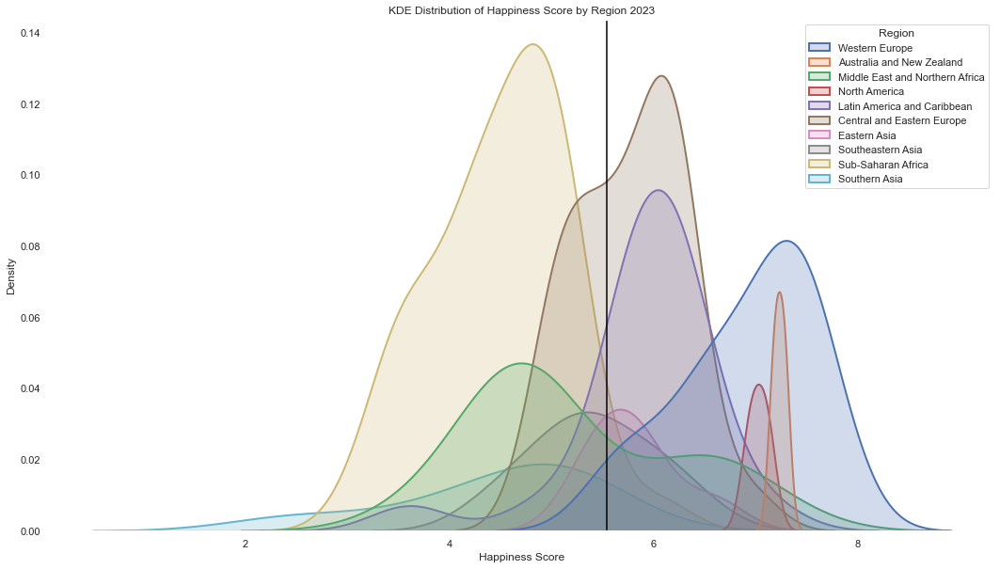

In [50]:
plot_kde_with_mean(df2022, "Happiness Score", "Region")


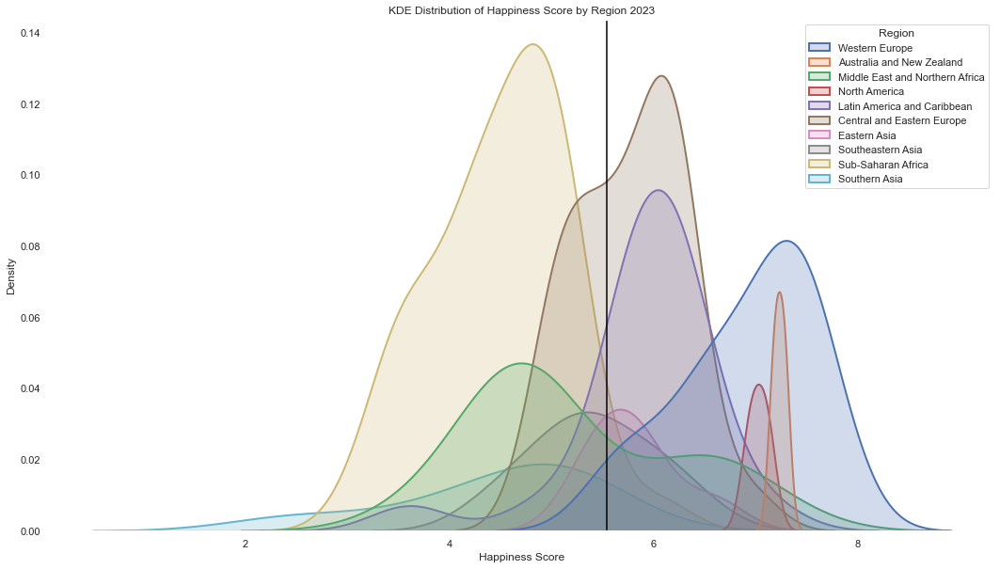

In [51]:
plot_kde_with_mean(df2023, "Happiness Score", "Region")


In [52]:
df2023

,Country,Region,Happiness Rank,Happiness Score,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Finland,Western Europe,1,7.8042,1.888380,1.584900,0.534574,0.771510,0.535299,0.126331,2.363241
1,Denmark,Western Europe,2,7.5864,1.949406,1.547875,0.537302,0.734416,0.525221,0.208459,2.083766
2,Iceland,Western Europe,3,7.5296,1.925508,1.619666,0.559096,0.738164,0.187119,0.249635,2.250382
3,Israel,Middle East and Northern Africa,4,7.4729,1.833398,1.520674,0.576730,0.568518,0.158292,0.124048,2.691290
4,Netherlands,Western Europe,5,7.4030,1.942274,1.488228,0.545473,0.672327,0.394062,0.250547,2.110044
...,...,...,...,...,...,...,...,...,...,...,...
131,Congo (Kinshasa),Sub-Saharan Africa,133,3.2072,0.530779,0.783747,0.104758,0.375472,0.068287,0.182573,1.161580
132,Zimbabwe,Sub-Saharan Africa,134,3.2035,0.758279,0.880513,0.068653,0.362508,0.117115,0.111627,0.904856
133,Sierra Leone,Sub-Saharan Africa,135,3.1376,0.669699,0.540343,0.091811,0.370907,0.051077,0.192731,1.221006
134,Lebanon,Middle East and Northern Africa,136,2.3922,1.416999,0.475936,0.398308,0.122771,0.027208,0.060824,-0.109798


In [53]:
df_list = [df2015, df2016, df2017, df2018, df2019, df2020, df2021, df2022, df2023]

def rename_column(dataframes):
    for df in dataframes:
        # Rename the 'Family' column to 'Social Support'
        df.rename(columns={'Family': 'Social Support'}, inplace=True)
        
rename_column(df_list)

In [54]:
import plotly.express as px

correlation_matrix = df2023[['Economy (GDP per Capita)', 'Social Support', 'Health (Life Expectancy)', 'Freedom',
         'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual', 'Happiness Score']].corr()

fig = px.imshow(correlation_matrix,
                labels=dict(color="Correlation"),
                x=correlation_matrix.columns,
                y=correlation_matrix.columns,
                color_continuous_scale='Viridis')

for i, row in enumerate(correlation_matrix.index):
    for j, col in enumerate(correlation_matrix.columns):
        fig.add_annotation(
            x=col, y=row,
            text=f'{correlation_matrix.iloc[i, j]:.2f}',  # Format the correlation values as desired
            showarrow=False,
            font=dict(color='white')
        )
        
fig.update_layout(title='Correlation Matrix',
                  xaxis_title='Factors',
                  yaxis_title='Factors')

fig.show()

In [55]:
dfs = [df2015, df2016, df2017, df2018, df2019]

# Concatenate DataFrames along the rows and reset the index
combined_df = pd.concat(dfs, axis=0, ignore_index=True)
combined_df
columns_to_aggregate = ['Happiness Score', 'Economy (GDP per Capita)', 'Social Support', 'Health (Life Expectancy)',
                        'Freedom', 'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual']

# Group the data by 'Country' and calculate the mean for selected numeric columns
aggregated_df = combined_df.groupby('Country')[columns_to_aggregate].mean().reset_index()

aggregated_df

,Country,Happiness Score,Economy (GDP per Capita),Social Support,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Afghanistan,3.51276,0.357002,0.409792,0.254585,0.117834,0.058122,0.267761,2.047492
1,Albania,4.71252,0.938609,0.754948,0.787815,0.371899,0.043305,0.167961,1.648138
2,Algeria,5.66758,1.012837,1.074060,0.665033,0.178400,0.146088,0.069187,2.521915
3,Angola,3.87220,0.798419,0.938373,0.133899,0.027433,0.071639,0.105236,1.797248
4,Argentina,6.45946,1.110872,1.330930,0.760768,0.481489,0.064149,0.092344,2.618870
...,...,...,...,...,...,...,...,...,...
166,Venezuela,5.53124,1.052302,1.323361,0.683762,0.213649,0.071427,0.057292,2.129544
167,Vietnam,5.15470,0.723297,1.138429,0.722605,0.577215,0.092069,0.195760,1.705385
168,Yemen,3.62574,0.489200,0.865305,0.365391,0.244163,0.067143,0.097040,1.497399
169,Zambia,4.58434,0.571759,0.932479,0.302740,0.461924,0.097237,0.218527,1.999633


In [56]:
sorted_aggregated_df = aggregated_df.sort_values(by='Happiness Score', ascending=False)

sorted_aggregated_df

,Country,Happiness Score,Economy (GDP per Capita),Social Support,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
38,Denmark,7.54608,1.396847,1.447698,0.865240,0.626081,0.429452,0.319018,2.461641
112,Norway,7.54092,1.519259,1.431052,0.873310,0.638233,0.343865,0.328979,2.406198
46,Finland,7.53780,1.357028,1.434511,0.873955,0.621442,0.398449,0.215652,2.636911
146,Switzerland,7.51150,1.472158,1.417388,0.928331,0.620501,0.379622,0.277430,2.416074
63,Iceland,7.51096,1.386616,1.492819,0.917635,0.617916,0.140145,0.419242,2.536592
...,...,...,...,...,...,...,...,...,...
126,Rwanda,3.43858,0.322220,0.788391,0.417554,0.581506,0.473532,0.226184,0.629177
139,South Sudan,3.38245,0.358600,0.492238,0.198351,0.116375,0.110787,0.242668,1.863456
147,Syria,3.29216,0.699016,0.355795,0.566164,0.081719,0.159572,0.431225,0.998736
26,Central African Republic,3.13425,0.032203,0.000000,0.050302,0.322547,0.053267,0.243158,2.432741


In [57]:
correlation_matrix = sorted_aggregated_df[['Economy (GDP per Capita)', 'Social Support', 'Health (Life Expectancy)', 'Freedom',
         'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual', 'Happiness Score']].corr()

fig = px.imshow(correlation_matrix,
                labels=dict(color="Correlation"),
                x=correlation_matrix.columns,
                y=correlation_matrix.columns,
                color_continuous_scale='Viridis')

for i, row in enumerate(correlation_matrix.index):
    for j, col in enumerate(correlation_matrix.columns):
        fig.add_annotation(
            x=col, y=row,
            text=f'{correlation_matrix.iloc[i, j]:.2f}',  # Format the correlation values as desired
            showarrow=False,
            font=dict(color='white')
        )
        
fig.update_layout(title='Correlation Matrix',
                  xaxis_title='Factors',
                  yaxis_title='Factors')

fig.show()

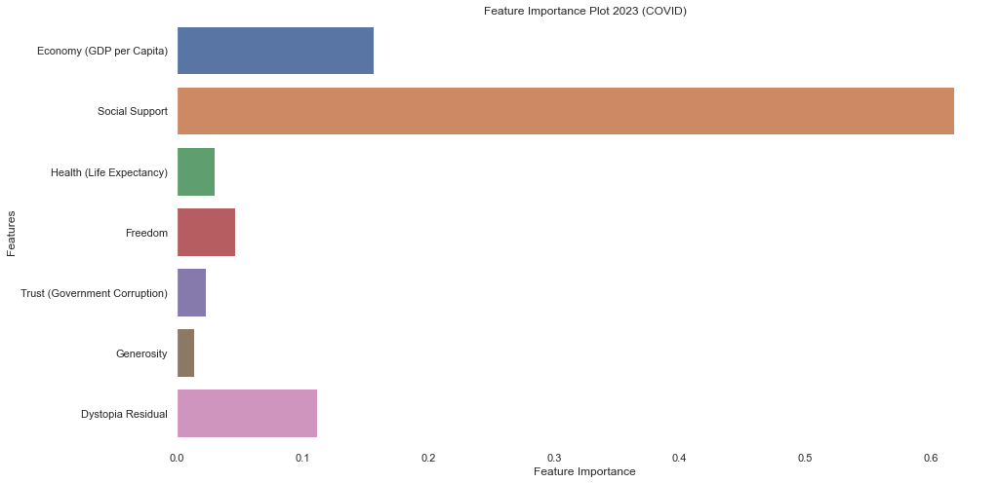

In [58]:
from sklearn.ensemble import RandomForestRegressor

# Assume X contains features (Economy, Family, Health, Freedom, Trust, Generosity)
X = df2023[['Economy (GDP per Capita)', 'Social Support', 'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual']]
y = df2023['Happiness Score']

# Initialize and train a Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a bar plot to display feature importances
plt.figure(figsize=(15, 8))
sns.barplot(x=feature_importances, y=X.columns)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance Plot 2023 (COVID)')
plt.show()

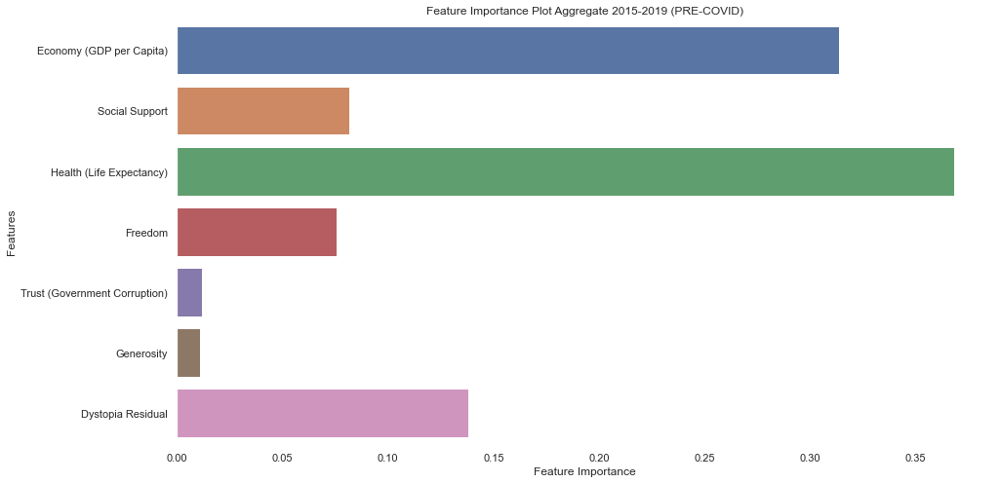

In [59]:
from sklearn.ensemble import RandomForestRegressor

# Assume X contains features (Economy, Family, Health, Freedom, Trust, Generosity)
X = aggregated_df[['Economy (GDP per Capita)', 'Social Support', 'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual']]
y = aggregated_df['Happiness Score']

# Initialize and train a Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)

# Get feature importances
feature_importances = rf.feature_importances_

# Create a bar plot to display feature importances
plt.figure(figsize=(15, 8))
sns.barplot(x=feature_importances, y=X.columns)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance Plot Aggregate 2015-2019 (PRE-COVID)')
plt.show()

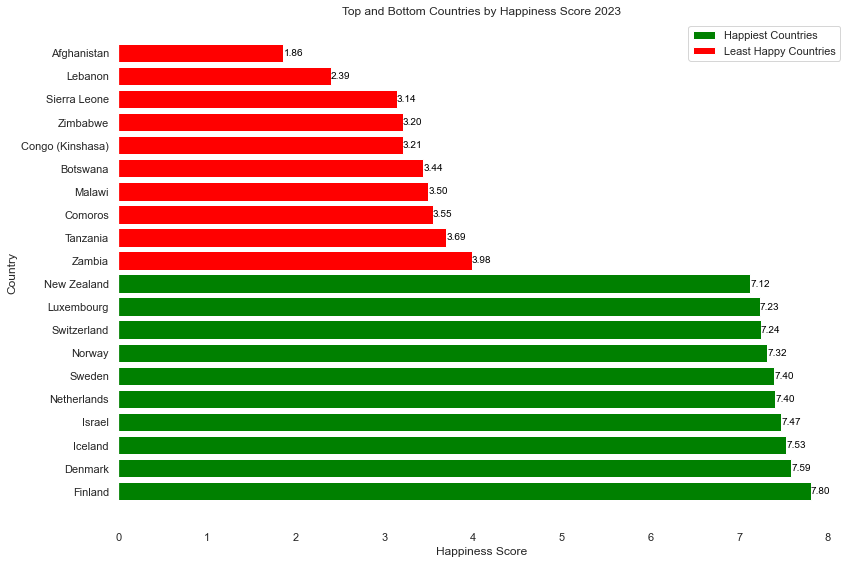

In [64]:
df2023_sorted = df2023.sort_values(by='Happiness Score', ascending=False)

# Select the top N and bottom N countries
N = 10  # You can adjust this value based on how many countries you want to display
top_countries = df2023_sorted.head(N)
bottom_countries = df2023_sorted.tail(N)

# Set a color palette for the plot
colors = ['green' for _ in range(N)] + ['red' for _ in range(N)]

# Plotting the happiest and least happy countries
plt.figure(figsize=(12, 8))
plt.barh(top_countries['Country'], top_countries['Happiness Score'], color=colors[:N], label='Happiest Countries')
plt.barh(bottom_countries['Country'], bottom_countries['Happiness Score'], color=colors[N:], label='Least Happy Countries')

# Add data labels to the bars
for index, value in enumerate(top_countries['Happiness Score']):
    plt.text(value, index, f'{value:.2f}', va='center', fontsize=10, color='black', ha='left')

for index, value in enumerate(bottom_countries['Happiness Score']):
    plt.text(value, index + len(top_countries), f'{value:.2f}', va='center', fontsize=10, color='black', ha='left')

plt.xlabel('Happiness Score')
plt.ylabel('Country')
plt.title('Top and Bottom Countries by Happiness Score 2023')
plt.legend()
plt.tight_layout()
plt.show()

In [69]:


singapore_data_list = []

# Loop through each CSV file for the years 2015 to 2023
for year in range(2015, 2024):
    # Construct the file path for the current year's CSV file
    file_path = f'/Users/sean/SC4024/{year}_cleaned.csv'  # Replace with the actual file path
    
    # Read the CSV file into a DataFrame
    df = pd.read_csv(file_path)
    
    # Filter the DataFrame to include only data for Singapore
    singapore_data = df[df['Country'] == 'Singapore']
    
    # Add the year as a new column
    singapore_data['Year'] = year
    
    # Add the filtered data to the list
    singapore_data_list.append(singapore_data)

# Concatenate the filtered data from all years into a single DataFrame
singapore_data_all_years = pd.concat(singapore_data_list, ignore_index=True)

# Now, 'singapore_data_all_years' contains the happiness data specifically for Singapore from 2015 to 2023, including the 'Year' column
print(singapore_data_all_years)








     Country             Region  Happiness Rank  Happiness Score  \
0  Singapore  Southeastern Asia              24           6.7980   
1  Singapore  Southeastern Asia              22           6.7390   
2  Singapore  Southeastern Asia              26           6.5720   
3  Singapore  Southeastern Asia              34           6.3432   
4  Singapore  Southeastern Asia              34           6.2620   
5  Singapore  Southeastern Asia              31           6.3771   
6  Singapore  Southeastern Asia              32           6.3765   
7  Singapore  Southeastern Asia              27           6.4802   
8  Singapore  Southeastern Asia              25           6.5867   

   Economy (GDP per Capita)    Family  Health (Life Expectancy)   Freedom  \
0                  1.521860  1.020000                  1.025250  0.542520   
1                  1.645550  0.867580                  0.947190  0.487700   
2                  1.692278  1.353814                  0.949492  0.549841   
3          

<ipython-input-69-9d1ec590f19a>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-69-9d1ec590f19a>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-69-9d1ec590f19a>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-69-9d1e

In [70]:
import plotly.express as px

# Assuming you have the 'singapore_data_all_years' DataFrame with 'Year' and 'Happiness Rank' columns
fig = px.line(singapore_data_all_years, x='Year', y='Happiness Rank',
              title='Happiness Ranking Trend in Singapore (2015-2023)',
              labels={'Happiness Rank': 'Happiness Rank', 'Year': 'Year'},
              template='plotly_white',  # Dark theme for better contrast
              markers=True,  # Display markers on the line plot
              color_discrete_sequence=['#1f77b4'],  # Set a distinct color for the line and markers
              width=800, height=500  # Set the dimensions of the plot
              )

# Add year labels on top of each marker
fig.update_traces(text=singapore_data_all_years['Year'], textposition='top center')

# Customize the y-axis to invert it
fig.update_yaxes(autorange="reversed", range=[0, 170])  # Invert the y-axis

# Customize the appearance of the plot
fig.update_layout(showlegend=False)  # Hide the legend if not needed

# Show the plot
fig.show()





In [71]:
# Assuming you have the 'singapore_data_all_years' DataFrame with 'Year' and 'Happiness Rank' columns
fig = px.line(singapore_data_all_years, x='Year', y='Economy (GDP per Capita)',
              title='Happiness Ranking Trend in Singapore (2015-2023)',
              labels={'Happiness Rank': 'Happiness Rank', 'Year': 'Year'},
              template='plotly_white',  # Dark theme for better contrast
              markers=True,  # Display markers on the line plot
              color_discrete_sequence=['#1f77b4'],  # Set a distinct color for the line and markers
              width=800, height=500  # Set the dimensions of the plot
              )

# Add year labels on top of each marker
fig.update_traces(text=singapore_data_all_years['Year'], textposition='top center')

# Customize the y-axis to invert it
fig.update_yaxes( range=[0, 2.5])  # Invert the y-axis

# Customize the appearance of the plot
fig.update_layout(showlegend=False)  # Hide the legend if not needed

# Show the plot
fig.show()

In [82]:

import plotly.express as px

import plotly.graph_objects as go

# Assuming you have the 'singapore_data_all_years' DataFrame with 'Year' and 'Family' columns
# and 'world_average_data' DataFrame with 'Year' and 'Family' columns for world average data

fig = go.Figure()

# Add Singapore's 'Family' variable as a line
fig.add_trace(go.Scatter(x=singapore_data_all_years['Year'], y=singapore_data_all_years['Family'],
                         mode='lines+markers', name='Singapore',
                         text=singapore_data_all_years['Year'], textposition='top center',
                         marker=dict(color='#1f77b4')))

# Add the world's average 'Family' variable as a dotted line
fig.add_trace(go.Scatter(x=world_average_data['Year'], y=world_average_data['Family'],
                         mode='lines', name='World Average',
                         line=dict(color='black', width=2, dash='dot')))

# Customize the layout
fig.update_layout(title='Happiness Ranking Trend in Singapore (2015-2023) with World Average',
                  xaxis_title='Year', yaxis_title='Family',
                  width=800, height=500, template='plotly_white')

# Show the plot
fig.show()



In [73]:
import pandas as pd
import glob

# List to store world data for each year
world_average_list = []
variables = ['Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual']
# Path to the directory containing the CSV files
data_directory = '/Users/sean/SC4024'

# Loop through each CSV file in the directory
for file_path in glob.glob(f'{data_directory}/*.csv'):
    year = int(file_path.split('/')[-1].split('_')[0])
    
    # Read the CSV file into a DataFrame
    world_data = pd.read_csv(file_path)
    
    # Calculate the world average for specific variables for the current year
    world_average = world_data[variables].mean()
    
    # Add the 'Year' column to the world average data
    world_average['Year'] = year
    
    # Add the world average data to the list
    world_average_list.append(world_average)

# Concatenate the world average data from all years into a single DataFrame
world_average_data = pd.concat(world_average_list, axis=1).T

world_average_data = world_average_data.sort_values(by='Year', ascending=True)
# Now, 'world_average_data' contains the average values for specific variables for each year
print(world_average_data)


   Economy (GDP per Capita)    Family  Health (Life Expectancy)   Freedom  \
2                  0.846137  0.991046                  0.630259  0.428615   
1                  0.953880  0.793621                  0.557619  0.370994   
5                  0.984718  1.188898                  0.551341  0.408786   
7                  0.887392  1.216608                  0.598043  0.456962   
4                  0.905108  1.208793                  0.725258  0.392550   
6                  0.868771  1.155607                  0.692869  0.463583   
0                  0.977153  0.793315                  0.520132  0.498687   
3                  1.410429  0.905834                  0.586146  0.517225   
8                  1.408929  1.155048                  0.366125  0.540898   

   Trust (Government Corruption)  Generosity  Dystopia Residual    Year  
2                       0.143422    0.237296           2.098977  2015.0  
1                       0.137624    0.242635           2.325807  2016.0  
5      

In [74]:
fig = go.Figure()

# Add Singapore's 'Family' variable as a line
fig.add_trace(go.Scatter(x=singapore_data_all_years['Year'], y=singapore_data_all_years['Health (Life Expectancy)'],
                         mode='lines+markers', name='Singapore',
                         text=singapore_data_all_years['Year'], textposition='top center',
                         marker=dict(color='#1f77b4')))

# Add the world's average 'Family' variable as a dotted line
fig.add_trace(go.Scatter(x=world_average_data['Year'], y=world_average_data['Health (Life Expectancy)'],
                         mode='lines', name='World Average',
                         line=dict(color='black', width=2, dash='dot')))

# Customize the layout
fig.update_layout(title='Happiness Ranking Trend in Singapore (2015-2023) with World Average',
                  xaxis_title='Year', yaxis_title='Health (Life Expectancy)',
                  width=800, height=500, template='plotly_white')

# Show the plot
fig.show()


In [75]:
fig = go.Figure()

# Add Singapore's 'Family' variable as a line
fig.add_trace(go.Scatter(x=singapore_data_all_years['Year'], y=singapore_data_all_years['Freedom'],
                         mode='lines+markers', name='Singapore',
                         text=singapore_data_all_years['Year'], textposition='top center',
                         marker=dict(color='#1f77b4')))

# Add the world's average 'Family' variable as a dotted line
fig.add_trace(go.Scatter(x=world_average_data['Year'], y=world_average_data['Freedom'],
                         mode='lines', name='World Average',
                         line=dict(color='black', width=2, dash='dot')))

# Customize the layout
fig.update_layout(title='Freedom Trend in Singapore (2015-2023) with World Average',
                  xaxis_title='Year', yaxis_title='Freedom',
                  width=800, height=500, template='plotly_white')

# Show the plot
fig.show()

In [76]:
fig = go.Figure()

# Add Singapore's 'Family' variable as a line
fig.add_trace(go.Scatter(x=singapore_data_all_years['Year'], y=singapore_data_all_years['Trust (Government Corruption)'],
                         mode='lines+markers', name='Singapore',
                         text=singapore_data_all_years['Year'], textposition='top center',
                         marker=dict(color='#1f77b4')))

# Add the world's average 'Family' variable as a dotted line
fig.add_trace(go.Scatter(x=world_average_data['Year'], y=world_average_data['Trust (Government Corruption)'],
                         mode='lines', name='World Average',
                         line=dict(color='black', width=2, dash='dot')))

# Customize the layout
fig.update_layout(title='Trust (Government Corruption) Trend in Singapore (2015-2023) with World Average',
                  xaxis_title='Year', yaxis_title='Freedom',
                  width=800, height=500, template='plotly_white')

# Show the plot
fig.show()

In [77]:
fig = go.Figure()

# Add Singapore's 'Family' variable as a line
fig.add_trace(go.Scatter(x=singapore_data_all_years['Year'], y=singapore_data_all_years['Generosity'],
                         mode='lines+markers', name='Singapore',
                         text=singapore_data_all_years['Year'], textposition='top center',
                         marker=dict(color='#1f77b4')))

# Add the world's average 'Family' variable as a dotted line
fig.add_trace(go.Scatter(x=world_average_data['Year'], y=world_average_data['Generosity'],
                         mode='lines', name='World Average',
                         line=dict(color='black', width=2, dash='dot')))

# Customize the layout
fig.update_layout(title='Generosity Trend in Singapore (2015-2023) with World Average',
                  xaxis_title='Year', yaxis_title='Freedom',
                  width=800, height=500, template='plotly_white')

# Show the plot
fig.show()

In [78]:
fig = go.Figure()

# Add Singapore's 'Family' variable as a line
fig.add_trace(go.Scatter(x=singapore_data_all_years['Year'], y=singapore_data_all_years['Dystopia Residual'],
                         mode='lines+markers', name='Singapore',
                         text=singapore_data_all_years['Year'], textposition='top center',
                         marker=dict(color='#1f77b4')))

# Add the world's average 'Family' variable as a dotted line
fig.add_trace(go.Scatter(x=world_average_data['Year'], y=world_average_data['Dystopia Residual'],
                         mode='lines', name='World Average',
                         line=dict(color='black', width=2, dash='dot')))

# Customize the layout
fig.update_layout(title='Dystopia Residual Trend in Singapore (2015-2023) with World Average',
                  xaxis_title='Year', yaxis_title='Dystopia Residual',
                  width=800, height=500, template='plotly_white')

# Show the plot
fig.show()

In [80]:
def plot_singpore_average_happiness(data_directory, country_name):
    # List to store average happiness scores for each year
    average_scores = []
    global_average_scores = []  # List to store global average happiness scores for each year

    # Loop through each data file in the directory
    for file_path in glob.glob(f'{data_directory}/*.csv'):
        # Read data for the current year
        df = pd.read_csv(file_path)
        
        # Calculate the average happiness score for the specified region
        selected_region_data = df[df['Country'] == country_name]
        average_score = selected_region_data['Happiness Score'].mean()

        # Calculate the global average happiness score for the current year
        global_average_score = df['Happiness Score'].mean()
        
        # Extract year from the file name (assuming the file name contains the year)
        year = int(file_path.split('/')[-1].split('_')[0])  # Adjust the file name parsing logic
        
        # Append the average scores along with the year to the respective lists
        average_scores.append({'Year': year, 'Average Happiness Score': average_score})
        global_average_scores.append({'Year': year, 'Global Average Happiness Score': global_average_score})

    # Convert the lists of dictionaries to DataFrames
    average_scores_df = pd.DataFrame(average_scores).sort_values(by='Year')
    global_average_scores_df = pd.DataFrame(global_average_scores).sort_values(by='Year')

    
    # Plot average happiness score for the specified region
    sns.set(style="darkgrid")
    plt.figure(figsize=(15, 8))
    
    # Plot average happiness score for the specified region
    sns.lineplot(x='Year', y='Average Happiness Score', data=average_scores_df, marker='o', label=f'{region_name} Average')
    
    # Plot global average happiness score
    sns.lineplot(x='Year', y='Global Average Happiness Score', data=global_average_scores_df, marker='o', label='Global Average', color='red')
    
    # Add annotations for specific data points (optional)
    for i, row in average_scores_df.iterrows():
        plt.text(row['Year'], row['Average Happiness Score'], f"{row['Average Happiness Score']:.2f}", ha='right', va='bottom')

    # Set plot labels and title
    plt.title(f'Average Happiness Score over Time for {country_name} and Global Average')
    plt.xlabel('Year')
    plt.ylabel('Average Happiness Score')
    plt.legend()
    plt.tight_layout()
    plt.show()


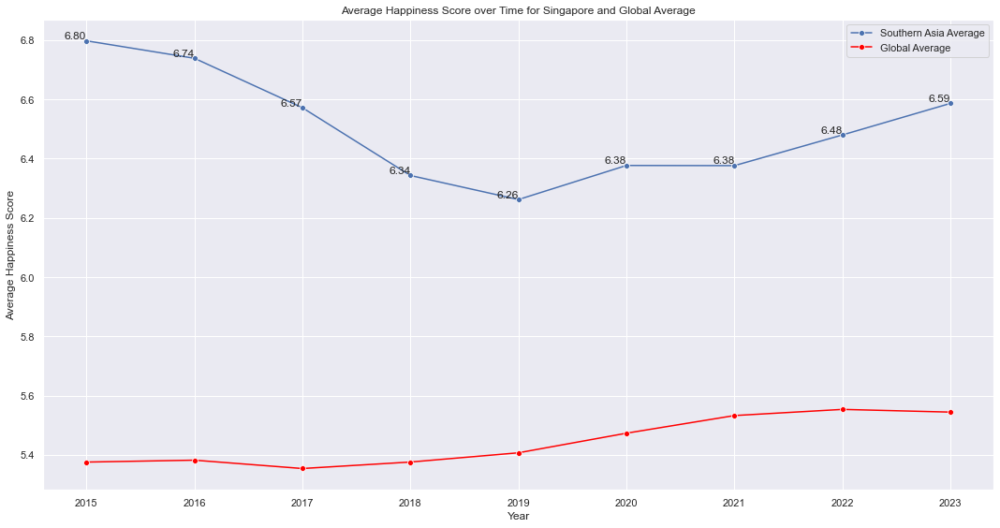

In [81]:
plot_singpore_average_happiness(data_directory, 'Singapore')
